# Setting up the notebook

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import bm3d

import torch.cuda
import torch.nn as nn
from torch.nn import Linear, ReLU, MSELoss, L1Loss, Sequential, Conv2d, ConvTranspose2d, MaxPool2d, AdaptiveAvgPool2d, Module, BatchNorm2d, Sigmoid, Dropout
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import random_split
from torchvision import datasets, transforms

from pytorch_model_summary import summary
import os

C:\Users\alaae\anaconda3\envs\torch_env\lib\site-packages\torchvision\io\image.py:11: UserWarning: Failed to load image Python extension: Could not find module 'C:\Users\alaae\anaconda3\envs\torch_env\Lib\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.
  warn(f"Failed to load image Python extension: {e}")


In [2]:
gpu_avail = torch.cuda.is_available()
print(f"Is the GPU available? {gpu_avail}")

Is the GPU available? True


In [3]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Device", device)

Device cuda


In [4]:
PATH = os.getcwd() + "\\Data\\thumbnails128x128"

In [5]:
data_dir = PATH 

transform = transforms.Compose([transforms.Resize(255),
                                transforms.ToTensor()
                               ])
dataset = datasets.ImageFolder(data_dir, transform=transform)
lengths = [int(len(dataset)*0.8), int(len(dataset)*0.2)]
train_dataset, val_dataset = random_split(dataset, lengths)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=True)

In [6]:
def imshow(image, ax=None, title=None, normalize=True):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
    image = image.numpy().transpose((1, 2, 0))

    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax

<AxesSubplot:>

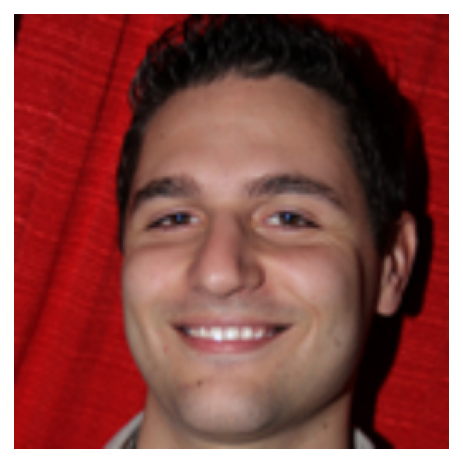

In [9]:
# Visualizing an image from the dataset
images, _ = next(iter(val_dataloader))
imshow(images[1], normalize=False)

# Expermenting with the noises

White Additive Noise :

In [10]:
noisy_images = (images + torch.normal(0,0.2, images.shape)).clip(0,1)

<AxesSubplot:>

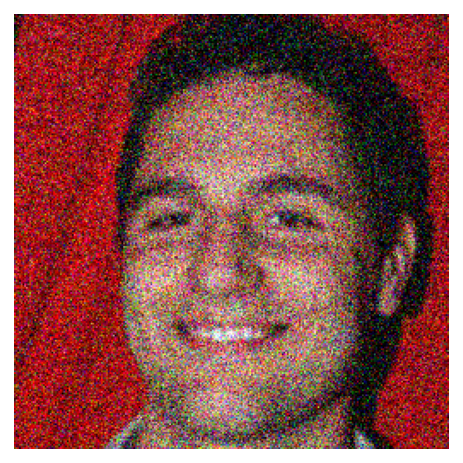

In [11]:
imshow(noisy_images[1], normalize=False)

Masking Noise :

In [12]:
a = 0.7*torch.ones(images.shape)
bernouilli_noisy_images = images*torch.bernoulli(a)

<AxesSubplot:>

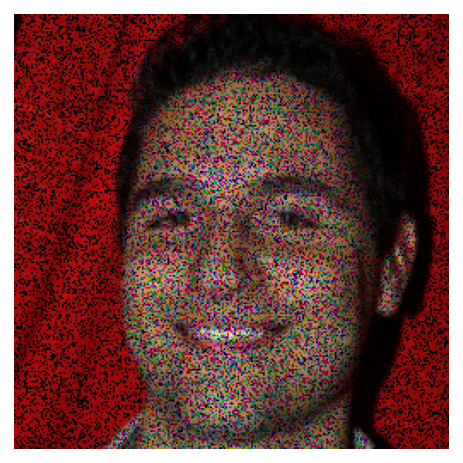

In [13]:
imshow(bernouilli_noisy_images[1], normalize=False)

Poisson Noise :

In [14]:
a = 5*torch.ones(images.shape)
p = torch.poisson(a)
p_norm = p/p.max()

In [15]:
poisson_noisy_images = (images + p_norm).clip(0,1)

<AxesSubplot:>

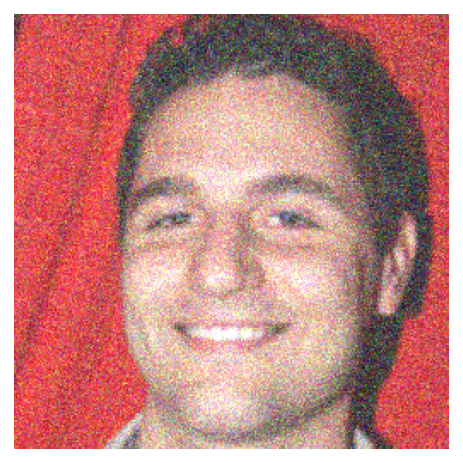

In [16]:
imshow(poisson_noisy_images[1], normalize=False)

In [7]:
EPS = 1e-8

In [8]:
def PSNR(input, target):
    return -10*torch.log10(torch.mean((input - target) ** 2, dim=[1, 2, 3])+EPS)

In [9]:
def MSE(input, target):
    return torch.mean((input - target) ** 2, dim=[1, 2, 3])

PSNR of Normal Noise Images :

In [20]:
PSNR(images, noisy_images)

tensor([15.0455, 15.1718, 14.7140, 14.7304, 15.3507, 15.3572, 14.9787, 14.8285,
        14.7231, 14.9067, 15.6183, 14.5245, 14.7026, 15.0107, 14.9028, 14.9212])

PSNR of Masked Images :

In [21]:
PSNR(images, bernouilli_noisy_images)

tensor([10.7218, 13.6338, 12.5109, 11.8838, 11.0169,  7.7124, 10.1220, 12.0363,
        11.0440,  9.5477, 16.9152,  9.7393, 11.7690, 10.0014,  9.8994, 12.6178])

PSNR of Poisson Noise Images :

In [22]:
PSNR(images, poisson_noisy_images)

tensor([11.7429, 10.9976, 11.1412, 11.1908, 11.7629, 13.7808, 11.9429, 11.2966,
        11.3740, 12.1885, 10.8384, 11.8166, 11.2383, 12.0369, 12.0351, 11.1616])

So these scores represent a baseline for us, the models that we will create need to have a significantly higher PSNR to be taken into consideration.

# Denoising using BM3D

In [23]:
denoised_image = bm3d.bm3d(noisy_images[1].permute(1,2,0), sigma_psd=30/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

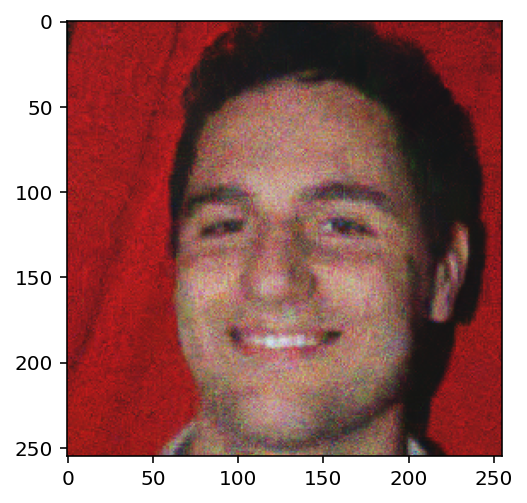

In [24]:
plt.imshow(denoised_image)

In [25]:
bernouilli_denoised_image = bm3d.bm3d(bernouilli_noisy_images[1].permute(1,2,0), sigma_psd=30/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


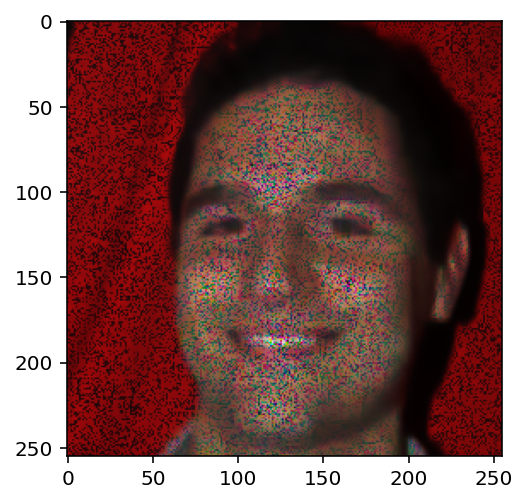

In [26]:
plt.imshow(bernouilli_denoised_image)

In [27]:
poisson_denoised_image = bm3d.bm3d(poisson_noisy_images[1].permute(1,2,0), sigma_psd=15/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING).clip(0,1)

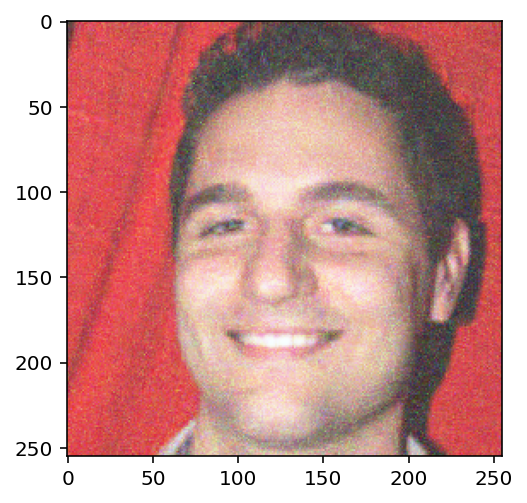

In [28]:
plt.imshow(poisson_denoised_image)

The BM3D method has given a significant improvement when used for the normal noise, but for the other two noises it wasn't as remarkable.

# Denoising using Deep Learning

## Autoencoders

In [11]:
class autoencoders(nn.Module):
    def __init__(self):
        super(autoencoders, self).__init__()
        self.encoder = Sequential(
            Conv2d(3, 32, kernel_size = (3,3), padding = "same"),
            ReLU(),
            MaxPool2d((2,2), padding = 0),
            Conv2d(32, 64, kernel_size = (3,3), padding = "same"),
            ReLU(),
            MaxPool2d((2,2), padding = 0),
            Conv2d(64, 128, kernel_size = (3,3), padding = "same"),
            ReLU(),
            MaxPool2d((2,2), padding = 0)
        )
        self.decoder = Sequential(
            ConvTranspose2d(128, 128, kernel_size = (3,3), stride = 2, padding = 0),
            ReLU(),
            ConvTranspose2d(128, 64, kernel_size = (3,3), stride = 2, padding = 0),
            ReLU(),
            ConvTranspose2d(64, 32, kernel_size = (3,3), stride = 2, padding = 0),
            ReLU(),
            ConvTranspose2d(32, 3, kernel_size = (3,3), stride = 1, padding = 1),
            Sigmoid()
        )
        
    def forward(self, images):
        x = self.encoder(images)
        x = self.decoder(x)
        return x

In [35]:
print(summary(autoencoders(), torch.zeros((1,3,255,255))))

----------------------------------------------------------------------------
         Layer (type)          Output Shape         Param #     Tr. Param #
             Conv2d-1     [1, 32, 255, 255]             896             896
               ReLU-2     [1, 32, 255, 255]               0               0
          MaxPool2d-3     [1, 32, 127, 127]               0               0
             Conv2d-4     [1, 64, 127, 127]          18,496          18,496
               ReLU-5     [1, 64, 127, 127]               0               0
          MaxPool2d-6       [1, 64, 63, 63]               0               0
             Conv2d-7      [1, 128, 63, 63]          73,856          73,856
               ReLU-8      [1, 128, 63, 63]               0               0
          MaxPool2d-9      [1, 128, 31, 31]               0               0
   ConvTranspose2d-10      [1, 128, 63, 63]         147,584         147,584
              ReLU-11      [1, 128, 63, 63]               0               0
   ConvTran

In [36]:
loss_module = MSELoss()

In [37]:
def eval_model(model, val_dataloader, noise_type, noise_parameter):
    model.eval()
    psnr = []
    mse = []
    with torch.no_grad():
        for images, _ in val_dataloader:
            if (noise_type == "normal"):
                noisy_images = (images + torch.normal(0,noise_parameter,images.shape)).clip(0,1)
            elif (noise_type == "bernoulli"):
                a = noise_parameter*torch.ones(images.shape)
                noisy_images = images*torch.bernoulli(a)
            elif (noise_type == "poisson"):
                a = noise_parameter*torch.ones(images.shape)
                p = torch.poisson(a)
                p_norm = p/p.max()
                noisy_images = (images + p_norm).clip(0,1)
            images = images.to(device)
            noisy_images = noisy_images.to(device)
            preds = model(images)
            psnr.extend(PSNR(images.cpu().detach(), preds.cpu().detach()))
            mse.extend(MSE(images.cpu().detach(), preds.cpu().detach()))
        print(f"Peak Signal to Noise Ratio:   Mean: {np.array(psnr).mean()} || Std: {np.array(psnr).std()}")
        print(f"Mean Squared Error:   Mean: {np.array(mse).mean()} || Std: {np.array(mse).std()}")
        return np.array(psnr).mean(), np.array(mse).mean()

In [38]:
def train_model(model, noise_type, noise_parameter, optimizer, train_dataloader, val_dataloader, loss_module, target_type="clean", num_epochs=30):
    model.train()
    epoch_num = []
    mse_train = []
    mse_val = []
    psnr_train = []
    psnr_val = []
    mse = 0.0
    psnr = 0.0
    for epoch in range(num_epochs):
        for images, _ in train_dataloader:
            targets = torch.clone(images)
            if (noise_type == "normal"):
                images = (images + torch.normal(0,noise_parameter,images.shape)).clip(0,1)
            elif (noise_type == "bernoulli"):
                a = noise_parameter*torch.ones(images.shape)
                images = images*torch.bernoulli(a)
            elif (noise_type == "poisson"):
                a = noise_parameter*torch.ones(images.shape)
                p = torch.poisson(a)
                p_norm = p/p.max()
                images = (images + p_norm).clip(0,1)
            if (target_type == "noisy"):
                if (noise_type == "normal"):
                    targets = (targets + torch.normal(0,noise_parameter,targets.shape)).clip(0,1)
                elif (noise_type == "bernoulli"):
                    a = noise_parameter*torch.ones(targets.shape)
                    targets = targets*torch.bernoulli(a)
                elif (noise_type == "poisson"):
                    a = noise_parameter*torch.ones(targets.shape)
                    p = torch.poisson(a)
                    p_norm = p/p.max()
                    targets = (targets + p_norm).clip(0,1)           
            images = images.to(device)
            targets = targets.to(device)
            preds = model(images)
            loss = loss_module(preds, targets)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        if (epoch%3 == 0):
            print(f"********EPOCH {epoch+1}:********")
            epoch_num.append(epoch+1)
            print("Train set:")
            psnr, mse = eval_model(model, train_dataloader, noise_type, noise_parameter)
            psnr_train.append(psnr)
            mse_train.append(mse)
            print("Validation set:")
            psnr, mse = eval_model(model, val_dataloader, noise_type, noise_parameter)
            
            psnr_val.append(psnr)
            mse_val.append(mse)

In the training and validation functions we've taken into consideration various noise types to make it easier if we want to generalize a model by training it each time on a different type and with different parameters.

In [35]:
normal_ae_mse = autoencoders()
normal_optimizer_mse = optim.Adam(normal_ae_mse.parameters(), lr=1e-3)
normal_ae_mse = normal_ae_mse.to(device)

In [60]:
bernoulli_ae = autoencoders()
bernoulli_optimizer = optim.Adam(bernoulli_ae.parameters(), lr=1e-3)
bernoulli_ae = bernoulli_ae.to(device)

In [61]:
poisson_ae = autoencoders()
poisson_optimizer = optim.Adam(poisson_ae.parameters(), lr=1e-3)
poisson_ae = poisson_ae.to(device)

In [65]:
%%time
train_model(normal_ae_mse, "normal", 0.2, normal_optimizer_mse, train_dataloader, val_dataloader, loss_module)

********EPOCH 1:********
Train set:
Peak Signal to Noise Ratio:   Mean: 14.906817436218262 || Std: 0.2994633615016937
Mean Squared Error:   Mean: 0.03238428011536598 || Std: 0.002182753523811698
Validation set:
Peak Signal to Noise Ratio:   Mean: 14.910439491271973 || Std: 0.29879048466682434
Mean Squared Error:   Mean: 0.03235698863863945 || Std: 0.002178394701331854
********EPOCH 4:********
Train set:
Peak Signal to Noise Ratio:   Mean: 14.956754684448242 || Std: 0.29304155707359314
Mean Squared Error:   Mean: 0.03201098367571831 || Std: 0.0021163278724998236
Validation set:
Peak Signal to Noise Ratio:   Mean: 14.95978832244873 || Std: 0.29231399297714233
Mean Squared Error:   Mean: 0.03198832646012306 || Std: 0.0021118950098752975
********EPOCH 7:********
Train set:
Peak Signal to Noise Ratio:   Mean: 14.963212013244629 || Std: 0.2952241897583008
Mean Squared Error:   Mean: 0.031964417546987534 || Std: 0.002126220613718033
Validation set:
Peak Signal to Noise Ratio:   Mean: 14.96696

In [41]:
ae = autoencoders()
ae = ae.to(device)

In [87]:
normal_ae.eval()

autoencoders(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (4): ReLU()
    (5): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (7): ReLU()
    (8): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2))
    (3): ReLU()
    (4): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU()
    (6): ConvTranspose2d(32, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): Sigmoid()
  )
)

In [63]:
images, _ = next(iter(train_dataloader))
images = images.float().to(device)
output = normal_ae(images)

<AxesSubplot:>

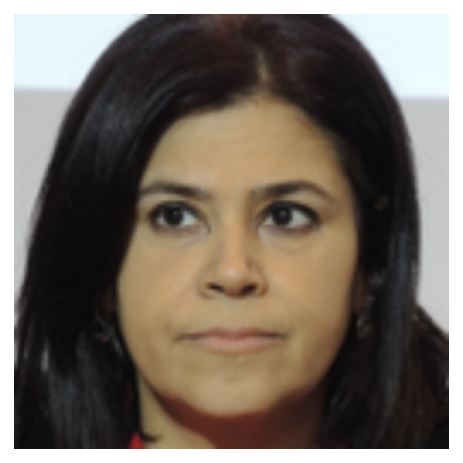

In [66]:
imshow(images[1].cpu().detach(), normalize=False)

In [68]:
images = (images + torch.normal(0,0.2,images.shape)).clip(0,1)

<AxesSubplot:>

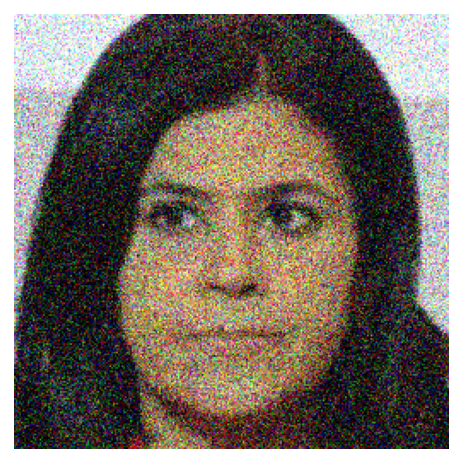

In [69]:
imshow(images[1], normalize=False)

In [71]:
output = normal_ae_mse(images.to(device))

<AxesSubplot:>

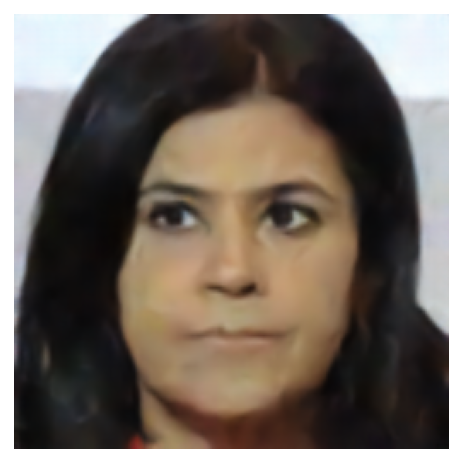

In [72]:
imshow(output[1].cpu().detach(), normalize=False)

In [74]:
images, _ = next(iter(val_dataloader))
images = images.float().to(device)
output = normal_ae_mse(images)

<AxesSubplot:>

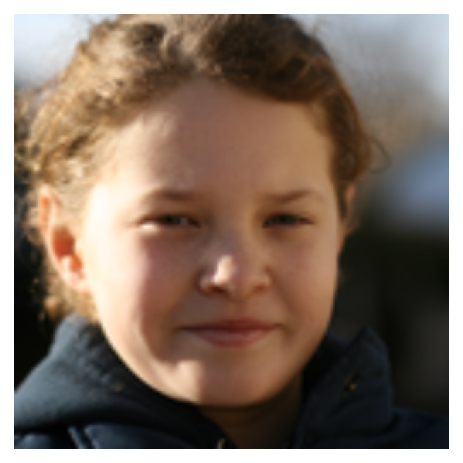

In [78]:
imshow(images[1].cpu().detach(), normalize = False)

In [79]:
noisy_images = (images + torch.normal(0,0.2,images.shape).to(device)).clip(0,1)

<AxesSubplot:>

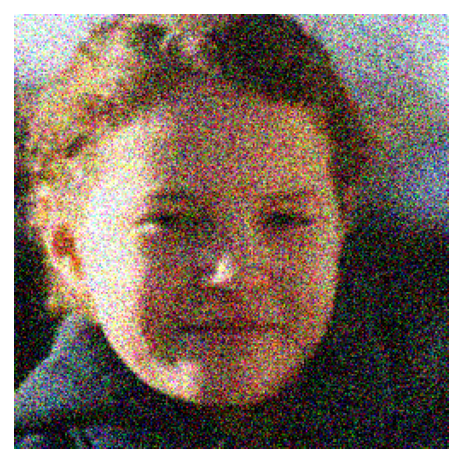

In [81]:
imshow(noisy_images[1].cpu().detach(), normalize = False)

In [82]:
output = normal_ae_mse(images)

<AxesSubplot:>

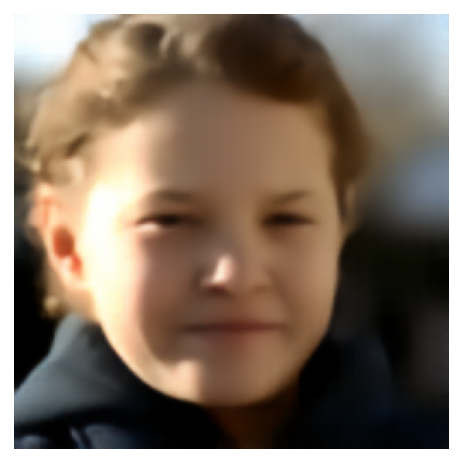

In [83]:
imshow(output[1].cpu().detach(), normalize=False)

In [84]:
MSE(images, output)

tensor([0.0007, 0.0009, 0.0008, 0.0018, 0.0008, 0.0021, 0.0009, 0.0009, 0.0008,
        0.0007, 0.0013, 0.0011, 0.0009, 0.0005, 0.0007, 0.0011],
       device='cuda:0', grad_fn=<MeanBackward1>)

In [85]:
PSNR(images, output)

tensor([31.6003, 30.5781, 30.9719, 27.4619, 30.9366, 26.7924, 30.4705, 30.2283,
        31.0592, 31.6168, 28.6999, 29.5315, 30.3071, 32.9174, 31.8622, 29.6615],
       device='cuda:0', grad_fn=<MulBackward0>)

In [86]:
a = 5*torch.ones(images.shape)
p = torch.poisson(a)
p_norm = p/p.max()
images = (images + p_norm.to(device)).clip(0,1)

<AxesSubplot:>

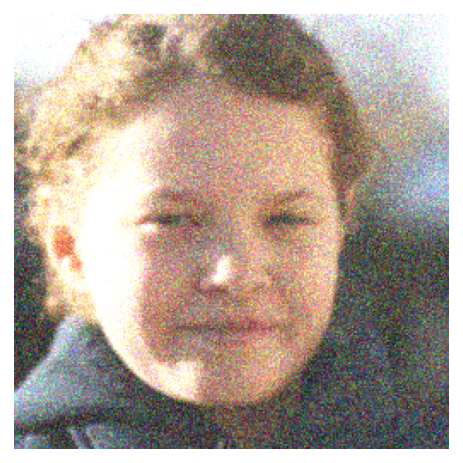

In [87]:
imshow(images[1].cpu().detach(), normalize=False)

In [88]:
output = normal_ae_mse(images)

<AxesSubplot:>

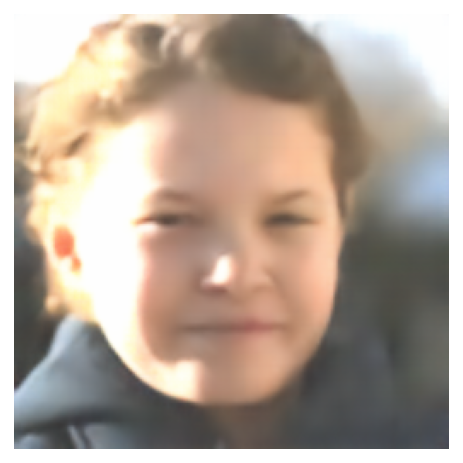

In [89]:
imshow(output[1].cpu().detach(), normalize=False)

The model actually gave us a good, but quite oversmoothed, result on a Poisson-Noisy image even though it wasn't trained on it.

In [97]:
normal_noisy_ae = autoencoders()
normal_noisy_optimizer = optim.Adam(normal_noisy_ae.parameters(), lr=1e-2)
normal_noisy_ae = normal_noisy_ae.to(device)

In [100]:
%%time
train_model(normal_noisy_ae, "noisy", 0.2, normal_noisy_optimizer, train_dataloader, loss_module)

********EPOCH1 :********
Train set:
Peak Signal to Noise Ratio:   Mean: 30.088289260864258 || Std: 1.9181557893753052
Mean Squared Error:   Mean: 0.0010882951319217682 || Std: 0.0005832577007822692
Validation set:
Peak Signal to Noise Ratio:   Mean: 30.08439064025879 || Std: 1.933030128479004
Mean Squared Error:   Mean: 0.0010906049283221364 || Std: 0.0005753510049544275
********EPOCH4 :********
Train set:
Peak Signal to Noise Ratio:   Mean: 28.996240615844727 || Std: 1.6914269924163818
Mean Squared Error:   Mean: 0.0013695870293304324 || Std: 0.0006693446775898337
Validation set:
Peak Signal to Noise Ratio:   Mean: 29.000198364257812 || Std: 1.6989586353302002
Mean Squared Error:   Mean: 0.001369444653391838 || Std: 0.0006713792681694031
********EPOCH7 :********
Train set:
Peak Signal to Noise Ratio:   Mean: 30.044034957885742 || Std: 1.6414347887039185
Mean Squared Error:   Mean: 0.0010705653112381697 || Std: 0.0005034102941863239
Validation set:
Peak Signal to Noise Ratio:   Mean: 3

Here we actually wanted to try an idea presented by J.Lehtinen et al. in the paper "Noise2Noise: Learning Image Restoration without Clean Data" ; basically providing noisy target and the optimization problem would lead the model to find the clean representation based on the hypothesis that the noise is centered.

In [115]:
images = images.float().to(device)
output = normal_noisy_ae(images)

<AxesSubplot:>

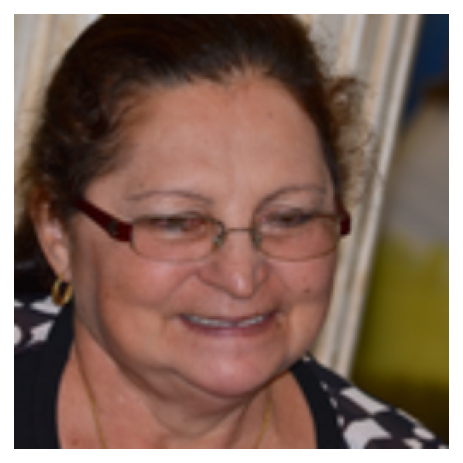

In [116]:
imshow(images[1].cpu().detach(), normalize=False)

<AxesSubplot:>

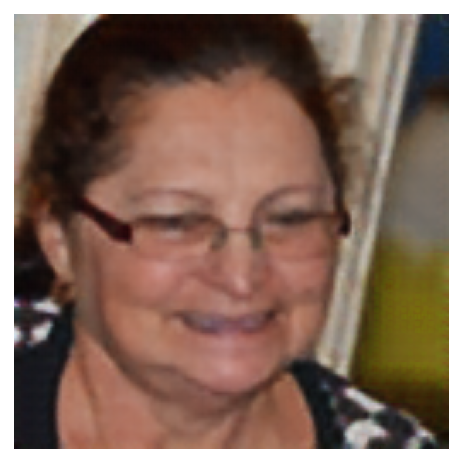

In [117]:
imshow(output[1].cpu().detach(), normalize=False)

In [118]:
images = (images + torch.normal(0,0.2,images.shape).to(device)).clip(0,1)

<AxesSubplot:>

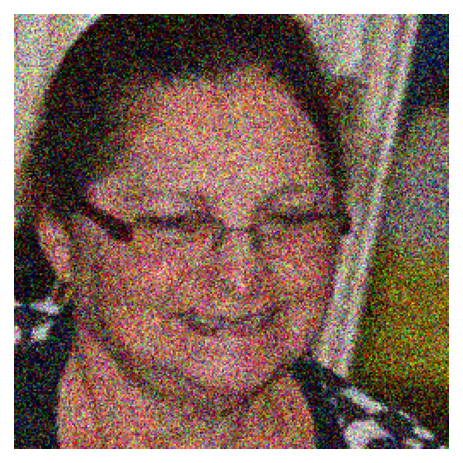

In [120]:
imshow(images[1].cpu().detach(), normalize=False)

In [121]:
output = normal_noisy_ae(images)

<AxesSubplot:>

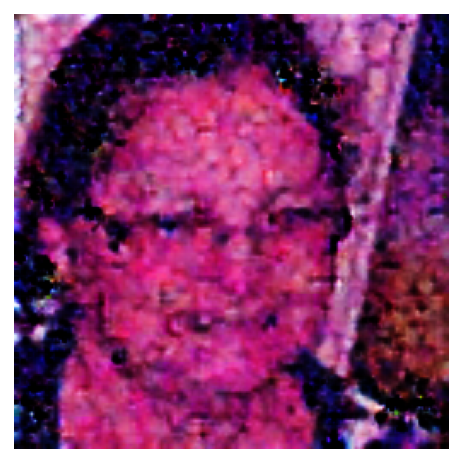

In [122]:
imshow(output[1].cpu().detach(), normalize=False)

Unfortunately, after training for a long time (around 6 hours), the model wasn't able to provide the desired result. This can be due to the limited size of the model or the number of the training epochs.

In [126]:
normal_noisy_optimizer = optim.Adam(normal_noisy_ae.parameters(), lr=0.005)

In [132]:
%%time
train_model(normal_noisy_ae, "clean", 0.2, normal_noisy_optimizer, train_dataloader, loss_module, num_epochs = 10)

********EPOCH1 :********
Train set:
Peak Signal to Noise Ratio:   Mean: 32.202083587646484 || Std: 2.006985902786255
Mean Squared Error:   Mean: 0.0006757053779438138 || Std: 0.0003762976557482034
Validation set:
Peak Signal to Noise Ratio:   Mean: 32.21363067626953 || Std: 2.0076398849487305
Mean Squared Error:   Mean: 0.0006745272548869252 || Std: 0.00038279243744909763
********EPOCH4 :********
Train set:
Peak Signal to Noise Ratio:   Mean: 32.51436233520508 || Std: 2.096621036529541
Mean Squared Error:   Mean: 0.0006353144417516887 || Std: 0.0003698538930620998
Validation set:
Peak Signal to Noise Ratio:   Mean: 32.52463912963867 || Std: 2.0960230827331543
Mean Squared Error:   Mean: 0.0006344273569993675 || Std: 0.0003772467898670584
********EPOCH7 :********
Train set:
Peak Signal to Noise Ratio:   Mean: 31.976625442504883 || Std: 1.8828353881835938
Mean Squared Error:   Mean: 0.0007027932442724705 || Std: 0.0003707767464220524
Validation set:
Peak Signal to Noise Ratio:   Mean: 31

<AxesSubplot:>

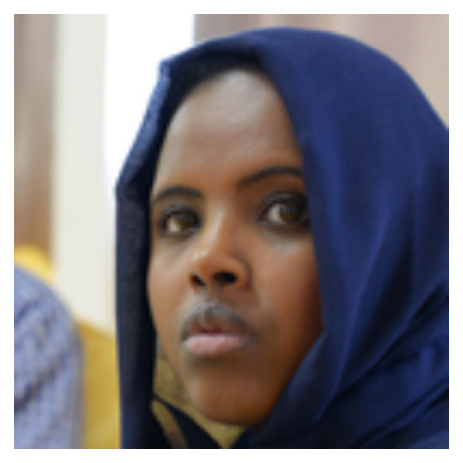

In [159]:
imshow(images[1].cpu().detach(), normalize=False)

In [162]:
noisy_images = (images + torch.normal(0,0.2,images.shape)).clip(0,1).to(device)

<AxesSubplot:>

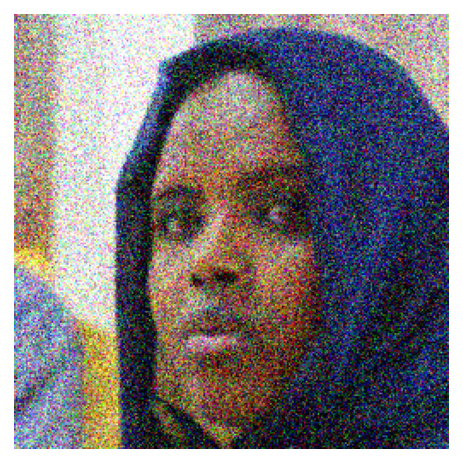

In [163]:
imshow(noisy_images[1].cpu().detach(), normalize=False)

In [1]:
output = normal_noisy_ae(noisy_images)

NameError: name 'normal_noisy_ae' is not defined

<AxesSubplot:>

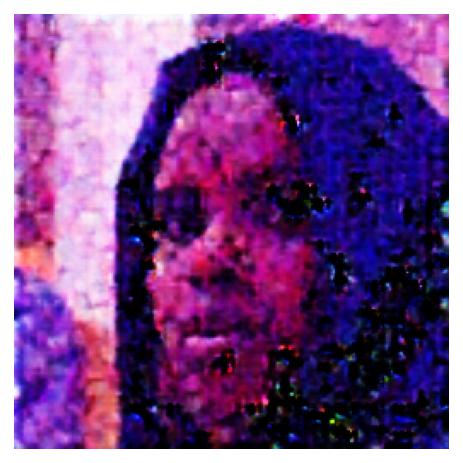

In [165]:
imshow(output[1].cpu().detach(), normalize=False)

We trained the model this time on clean target (keeping the same model that was trained on noisy data), but it seems like there is no hope with it so we decided to move on from the idea.

In [96]:
# Saving the weights of the first model
state_dict = normal_ae_mse.state_dict()
print(state_dict)

OrderedDict([('encoder.0.weight', tensor([[[[-2.5932e-02,  1.0921e-01, -5.8373e-02],
          [ 6.4295e-03,  1.5446e-01, -9.4039e-03],
          [ 2.8698e-02, -3.1897e-02, -3.5981e-02]],

         [[-3.5871e-02, -1.1047e-02, -4.2172e-02],
          [ 9.8653e-02,  1.2237e-01,  5.8641e-02],
          [ 4.7942e-02,  9.2055e-02,  8.1070e-02]],

         [[-4.8345e-02, -8.4047e-03, -1.1027e-02],
          [ 5.3948e-02,  8.0114e-02,  2.4105e-02],
          [ 4.8194e-02,  6.3057e-02,  8.6977e-03]]],


        [[[-1.0702e-01, -1.1367e-02, -5.9677e-02],
          [-1.1013e-01, -9.1911e-02, -2.5080e-02],
          [ 3.2054e-02, -2.0241e-02, -4.4348e-02]],

         [[ 1.1971e-03, -2.1977e-03,  5.2258e-02],
          [-1.4892e-02, -1.1980e-02,  8.9932e-03],
          [-1.5992e-02, -7.1291e-03, -5.5051e-02]],

         [[ 4.2381e-02, -1.4427e-02, -2.2694e-02],
          [ 5.0997e-02, -1.9537e-02,  6.7428e-03],
          [ 5.5221e-02, -4.5973e-02, -3.6613e-02]]],


        [[[ 1.2372e-02,  2.2887e

In [39]:
loss_module = L1Loss()

In [40]:
normal_ae_mae = autoencoders()
normal_optimizer_mae = optim.Adam(normal_ae_mae.parameters(), lr=1e-3)
normal_ae_mae = normal_ae_mae.to(device)

In [41]:
%%time
train_model(normal_ae_mae, "normal", 0.2, normal_optimizer_mae, train_dataloader, val_dataloader, loss_module)

********EPOCH 1:********
Train set:
Peak Signal to Noise Ratio:   Mean: 14.866059303283691 || Std: 0.3048143982887268
Mean Squared Error:   Mean: 0.03269222006201744 || Std: 0.0022358400747179985
Validation set:
Peak Signal to Noise Ratio:   Mean: 14.864397048950195 || Std: 0.3056671619415283
Mean Squared Error:   Mean: 0.032705146819353104 || Std: 0.0022421441972255707
********EPOCH 4:********
Train set:
Peak Signal to Noise Ratio:   Mean: 14.933578491210938 || Std: 0.2907985746860504
Mean Squared Error:   Mean: 0.03218121454119682 || Std: 0.00211341236717999
Validation set:
Peak Signal to Noise Ratio:   Mean: 14.932557106018066 || Std: 0.2935751974582672
Mean Squared Error:   Mean: 0.032190099358558655 || Std: 0.0021321563981473446
********EPOCH 7:********
Train set:
Peak Signal to Noise Ratio:   Mean: 14.944038391113281 || Std: 0.28686320781707764
Mean Squared Error:   Mean: 0.032101936638355255 || Std: 0.0020814889576286077
Validation set:
Peak Signal to Noise Ratio:   Mean: 14.943

We trained the second model (same architecture but different loss function).

In [42]:
images = images.float().to(device)

<AxesSubplot:>

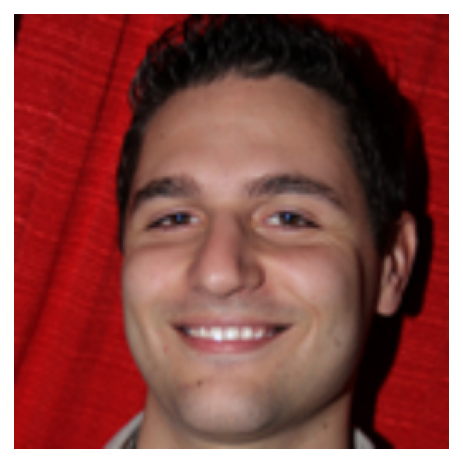

In [43]:
imshow(images[1].cpu().detach(), normalize = False)

In [44]:
output = normal_ae_mae(images)

<AxesSubplot:>

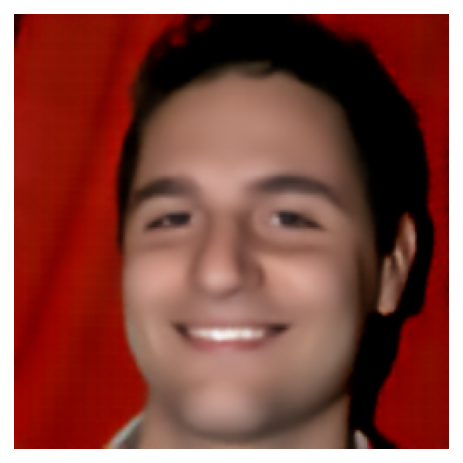

In [45]:
imshow(output[1].cpu().detach(), normalize = False)

In [46]:
noisy_images = (images.cpu().detach() + torch.normal(0,0.2,images.shape)).clip(0,1).to(device)

<AxesSubplot:>

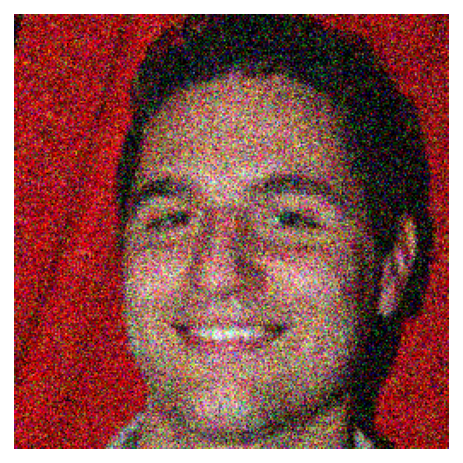

In [54]:
imshow(noisy_images[1].cpu().detach(), normalize = False)

In [47]:
output = normal_ae_mae(noisy_images)

<AxesSubplot:>

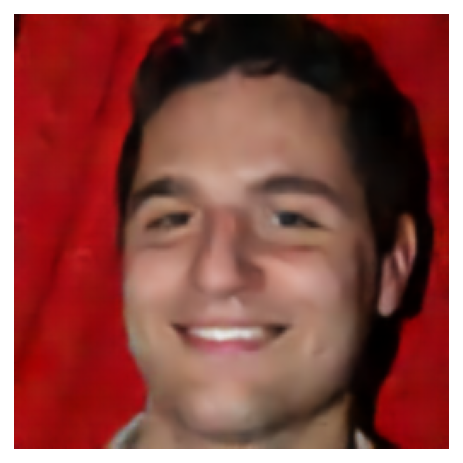

In [48]:
imshow(output[1].cpu().detach(), normalize = False)

In [49]:
state_dict = torch.load("normal_ae_mse_30epochs.tar")
normal_ae_mse = autoencoders()
normal_ae_mse.load_state_dict(state_dict)

<All keys matched successfully>

In [51]:
normal_ae_mse = normal_ae_mse.to(device)

In [52]:
output1 = normal_ae_mse(noisy_images)

<AxesSubplot:>

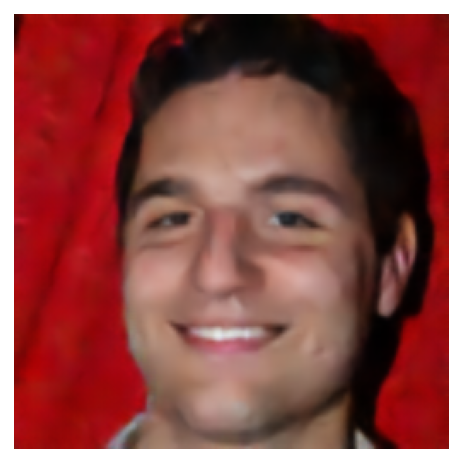

In [53]:
imshow(output1[1].cpu().detach(), normalize = False)

In [ ]:
state_dict = normal_mae.state_dict()

## RIDNet - Residual Image Denoising Network

In [205]:
class EAM(nn.Module):
    def __init__(self):
        super(EAM, self).__init__()
        
        self.conv1 = Conv2d(64,64, kernel_size = (3,3), dilation = 1, padding = 'same')
        self.conv2 = Conv2d(64,64, kernel_size = (3,3), dilation = 2, padding = 'same')
        
        self.conv3 = Conv2d(64,64, kernel_size = (3,3), dilation = 3, padding = 'same')
        self.conv4 = Conv2d(64,64, kernel_size = (3,3), dilation = 4, padding = 'same')
        
        self.conv5 = Conv2d(128,64, kernel_size = (3,3), padding = 'same')
        
        self.conv6 = Conv2d(64,64, kernel_size = (3,3), padding = 'same')
        self.conv7 = Conv2d(64,64, kernel_size = (3,3), padding = 'same')
        
        self.conv8 = Conv2d(64,64, kernel_size = (3,3), padding = 'same')
        self.conv9 = Conv2d(64,64, kernel_size = (3,3), padding = 'same')
        self.conv10 = Conv2d(64,64, kernel_size = (1,1), padding = 'same')
        
        self.aap = AdaptiveAvgPool2d((1,1))
        
        self.conv11 = Conv2d(64,64, kernel_size = (3,3), padding = 'same')
        self.conv12 = Conv2d(64,64, kernel_size = (3,3), padding = 'same')
        
        self.relu = ReLU()
        self.sigmoid = Sigmoid()
        
        
    def forward(self, images):
        conv1 = self.relu(self.conv1(images))
        conv1 = self.relu(self.conv2(conv1))

        conv2 = self.relu(self.conv3(images))
        conv2 = self.relu(self.conv4(conv2))

        concat = torch.cat((conv1,conv2),dim=1)
        conv3 = self.relu(self.conv5(concat))
        add1 = torch.add(images,conv3)

        conv4 = self.relu(self.conv6(add1))
        conv4 = self.conv7(conv4)
        add2 = torch.add(conv4,add1)
        add2 = self.relu(add2)

        conv5 = self.relu(self.conv8(add2))
        conv5 = self.relu(self.conv9(conv5))
        conv5 = self.conv10(conv5)
        add3 = torch.add(add2,conv5)
        add3 = self.relu(add3)

        aap = self.aap(add3)
        #aap = torch.reshape(aap,(aap.shape[0],64,1,1))
        conv6 = self.relu(self.conv11(aap))
        conv6 = self.sigmoid(self.conv12(conv6))

        out = torch.multiply(conv6, add3)
        return out

In [206]:
print(summary(EAM(), torch.zeros((1,64,255,255))))

------------------------------------------------------------------------------
           Layer (type)          Output Shape         Param #     Tr. Param #
               Conv2d-1     [1, 64, 255, 255]          36,928          36,928
                 ReLU-2     [1, 64, 255, 255]               0               0
               Conv2d-3     [1, 64, 255, 255]          36,928          36,928
                 ReLU-4     [1, 64, 255, 255]               0               0
               Conv2d-5     [1, 64, 255, 255]          36,928          36,928
                 ReLU-6     [1, 64, 255, 255]               0               0
               Conv2d-7     [1, 64, 255, 255]          36,928          36,928
                 ReLU-8     [1, 64, 255, 255]               0               0
               Conv2d-9     [1, 64, 255, 255]          73,792          73,792
                ReLU-10     [1, 64, 255, 255]               0               0
              Conv2d-11     [1, 64, 255, 255]          36,928  

In [207]:
class RIDNet(nn.Module):
    def __init__(self):
        super(RIDNet,self).__init__()
        self.conv1 = Conv2d(3,64, kernel_size = (3,3), padding = 'same')
        self.eam1 = EAM()
        self.eam2 = EAM()
        self.eam3 = EAM()
        self.eam4 = EAM()
        self.conv2 = Conv2d(64,3, kernel_size = (3,3), padding = 'same')
        
    def forward(self, images):
        x = self.conv1(images)
        x = self.eam1(x)
        x = self.eam2(x)
        x = self.eam3(x)
        x = self.eam4(x)
        x = self.conv2(x)
        x = torch.add(x,images)
        x = x.clip(0,1)
        return x

In [210]:
print(summary(RIDNet(), torch.zeros((1,3,255,255))))

-------------------------------------------------------------------------
      Layer (type)          Output Shape         Param #     Tr. Param #
          Conv2d-1     [1, 64, 255, 255]           1,792           1,792
             EAM-2     [1, 64, 255, 255]         447,232         447,232
             EAM-3     [1, 64, 255, 255]         447,232         447,232
             EAM-4     [1, 64, 255, 255]         447,232         447,232
             EAM-5     [1, 64, 255, 255]         447,232         447,232
          Conv2d-6      [1, 3, 255, 255]           1,731           1,731
Total params: 1,792,451
Trainable params: 1,792,451
Non-trainable params: 0
-------------------------------------------------------------------------


In [219]:
normal_ridnet = RIDNet()
normal_optimizer = optim.Adam(normal_ridnet.parameters(), lr=1e-3)
normal_ridnet = normal_ridnet.to(device)

In [220]:
loss_module = L1Loss()

In [221]:
%%time
train_model(normal_ridnet, "normal", 0.2, normal_optimizer, train_dataloader, loss_module, num_epochs = 5)

RuntimeError: CUDA out of memory. Tried to allocate 64.00 MiB (GPU 0; 4.00 GiB total capacity; 2.20 GiB already allocated; 2.45 MiB free; 2.42 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

This is a model that we tried to train but the number of parameters was too high.

## UNet

In [9]:
unet = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
    in_channels=3, out_channels=1, init_features=32, pretrained=True)

Using cache found in C:\Users\alaae/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


In [12]:
print(summary(unet, torch.zeros((1,3,256,256))))

----------------------------------------------------------------------------
         Layer (type)          Output Shape         Param #     Tr. Param #
             Conv2d-1     [1, 32, 256, 256]             864             864
        BatchNorm2d-2     [1, 32, 256, 256]              64              64
               ReLU-3     [1, 32, 256, 256]               0               0
             Conv2d-4     [1, 32, 256, 256]           9,216           9,216
        BatchNorm2d-5     [1, 32, 256, 256]              64              64
               ReLU-6     [1, 32, 256, 256]               0               0
          MaxPool2d-7     [1, 32, 128, 128]               0               0
             Conv2d-8     [1, 64, 128, 128]          18,432          18,432
        BatchNorm2d-9     [1, 64, 128, 128]             128             128
              ReLU-10     [1, 64, 128, 128]               0               0
            Conv2d-11     [1, 64, 128, 128]          36,864          36,864
       Batc

In [18]:
class UNetDenoising(nn.Module):
    def __init__(self, original_model):
        super(UNetDenoising, self).__init__()
        self.features = nn.Sequential(*list(original_model.children())[:-1])
        self.conv = nn.Conv2d(32, 3, kernel_size=1)
        
    def forward(self, x):
        x = self.features(x)
        x = self.conv(x)
        return x

In [19]:
for param in unet.parameters():
    param.requires_grad = False

In [33]:
print(summary(unet, torch.zeros((1,3,256,256))))

----------------------------------------------------------------------------
         Layer (type)          Output Shape         Param #     Tr. Param #
             Conv2d-1     [1, 32, 256, 256]             864               0
        BatchNorm2d-2     [1, 32, 256, 256]              64               0
               ReLU-3     [1, 32, 256, 256]               0               0
             Conv2d-4     [1, 32, 256, 256]           9,216               0
        BatchNorm2d-5     [1, 32, 256, 256]              64               0
               ReLU-6     [1, 32, 256, 256]               0               0
          MaxPool2d-7     [1, 32, 128, 128]               0               0
             Conv2d-8     [1, 64, 128, 128]          18,432               0
        BatchNorm2d-9     [1, 64, 128, 128]             128               0
              ReLU-10     [1, 64, 128, 128]               0               0
            Conv2d-11     [1, 64, 128, 128]          36,864               0
       Batc

In [20]:
unet_denoising = UNetDenoising(unet)

In [23]:
unet_denoising = unet_denoising.to(device)

In [32]:
print(summary(unet_denoising, torch.zeros((1,3,256,256))))

RuntimeError: Given groups=1, weight of size [256, 512, 3, 3], expected input[1, 256, 32, 32] to have 512 channels, but got 256 channels instead

In [27]:
images = images.to(device)

In [28]:
output = unet_denoising(images)

RuntimeError: Given groups=1, weight of size [256, 512, 3, 3], expected input[16, 256, 32, 32] to have 512 channels, but got 256 channels instead

In [ ]:
imshow(output.cpu().detach(), normalize=False

Again no luck with this model, so we decided to scrap the idea and move on.

## Results from the Auto-Encoder Models

In [12]:
normal_ae_mse = autoencoders()
state_dict = torch.load("normal_ae_mse_30epochs.tar")
normal_ae_mse.load_state_dict(state_dict)

<All keys matched successfully>

In [16]:
normal_ae_mse = normal_ae_mse.to(device)

In [28]:
psnr = []
with torch.no_grad():
        for i, (images, _) in enumerate(val_dataloader):
            noisy_images = (images + torch.normal(0,0.2,images.shape)).clip(0,1)
            noisy_images = noisy_images.to(device)
            images = images.to(device)
            preds = normal_ae_mse(noisy_images)
            if (i<4):
                print(PSNR(images.cpu().detach(), preds.cpu().detach()))
            psnr.extend(PSNR(images.cpu().detach(), preds.cpu().detach()))

tensor([32.2833, 30.8433, 32.4350, 30.6101, 30.3108, 31.5691, 31.4351, 29.2230,
        32.8790, 31.2358, 32.6246, 32.2855, 31.4341, 31.2321, 29.0547, 31.3054])
tensor([31.9023, 30.1507, 31.9846, 30.5237, 27.2167, 31.5429, 32.2309, 27.5366,
        32.1596, 30.5044, 31.7580, 32.4282, 31.8681, 31.4983, 31.5647, 30.5315])
tensor([31.0854, 30.0426, 29.4039, 29.5714, 31.8750, 30.8378, 31.7870, 31.5174,
        30.6467, 29.6023, 32.5151, 30.7479, 32.5943, 32.5141, 30.8841, 32.0164])
tensor([31.1970, 31.4144, 32.5338, 31.4886, 32.2991, 31.1814, 30.7807, 30.8734,
        31.8242, 31.5383, 30.2678, 33.0543, 31.2940, 30.3157, 31.6967, 29.7400])


In [29]:
mse_psnr = psnr.copy()

In [30]:
mse_psnr = np.array(mse_psnr)

In [31]:
print(f"The mean of the PSNR is {mse_psnr.mean()} and the standard deviation of the PSNR is {mse_psnr.std()}")

The mean of the PSNR is 31.12668800354004 and the standard deviation of the PSNR is 1.1921919584274292


In [33]:
normal_ae_mae = autoencoders()
state_dict = torch.load("normal_ae_mae_30epochs.tar")
normal_ae_mae.load_state_dict(state_dict)

<All keys matched successfully>

In [34]:
normal_ae_mae = normal_ae_mae.to(device)

In [35]:
psnr = []
with torch.no_grad():
        for i, (images, _) in enumerate(val_dataloader):
            noisy_images = (images + torch.normal(0,0.2,images.shape)).clip(0,1)
            noisy_images = noisy_images.to(device)
            images = images.to(device)
            preds = normal_ae_mae(noisy_images)
            if (i<4):
                print(PSNR(images.cpu().detach(), preds.cpu().detach()))
            psnr.extend(PSNR(images.cpu().detach(), preds.cpu().detach()))

tensor([29.4592, 31.3066, 31.6876, 30.9590, 30.5436, 31.8646, 30.3111, 30.1185,
        29.3258, 30.3092, 29.3356, 29.7291, 29.3288, 29.4790, 29.5335, 31.0726])
tensor([30.4952, 32.4927, 30.5290, 31.8470, 31.4300, 31.6980, 32.7516, 31.6140,
        31.2291, 30.6954, 30.8256, 32.8908, 29.6929, 29.4467, 31.8705, 30.7059])
tensor([30.7812, 30.7774, 31.1564, 31.3174, 29.8485, 33.2823, 31.1670, 32.9513,
        32.3911, 32.4319, 31.5301, 31.4431, 31.1010, 29.9347, 30.2555, 30.1913])
tensor([30.5692, 33.2136, 30.4152, 31.8177, 30.7003, 31.1533, 32.8191, 30.4588,
        31.7312, 30.3418, 31.6061, 29.9878, 31.7046, 30.8888, 32.3605, 32.5520])


In [37]:
mae_psnr = np.array(psnr.copy())
print(f"The mean of the PSNR is {mae_psnr.mean()} and the standard deviation of the PSNR is {mae_psnr.std()}")

The mean of the PSNR is 31.070117950439453 and the standard deviation of the PSNR is 1.2800648212432861


In [51]:
psnr=[]
for i, (images, _) in enumerate(val_dataloader):
    noisy_images = (images + torch.normal(0,0.2,images.shape)).clip(0,1)
    for j in range(images.shape[0]):
        psnr.append(PSNR(images[j,:,:,:].unsqueeze(0), torch.tensor(bm3d.bm3d(noisy_images[j,:,:,:].permute(1,2,0), sigma_psd=30/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)).permute(2,0,1).unsqueeze(0)))
    if (i<4):
        print(psnr)

[tensor([23.2929], dtype=torch.float64), tensor([23.3740], dtype=torch.float64), tensor([23.3597], dtype=torch.float64), tensor([23.5101], dtype=torch.float64), tensor([23.6286], dtype=torch.float64), tensor([23.7449], dtype=torch.float64), tensor([23.5922], dtype=torch.float64), tensor([23.5804], dtype=torch.float64), tensor([24.2298], dtype=torch.float64), tensor([24.0320], dtype=torch.float64), tensor([24.0238], dtype=torch.float64), tensor([23.5209], dtype=torch.float64), tensor([23.8739], dtype=torch.float64), tensor([24.0377], dtype=torch.float64), tensor([23.1295], dtype=torch.float64), tensor([23.6058], dtype=torch.float64)]
[tensor([23.2929], dtype=torch.float64), tensor([23.3740], dtype=torch.float64), tensor([23.3597], dtype=torch.float64), tensor([23.5101], dtype=torch.float64), tensor([23.6286], dtype=torch.float64), tensor([23.7449], dtype=torch.float64), tensor([23.5922], dtype=torch.float64), tensor([23.5804], dtype=torch.float64), tensor([24.2298], dtype=torch.float64)

KeyboardInterrupt: 

In [54]:
bm3d_psnr = torch.tensor(psnr.copy())
print(f"The mean of the PSNR is {bm3d_psnr.mean()} and the standard deviation of the PSNR is {bm3d_psnr.std()}")

The mean of the PSNR is 23.5729346128809 and the standard deviation of the PSNR is 0.4025119048011183
